In [6]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import folium
import pandas as pd
from folium.plugins import HeatMap
from folium import plugins
import math
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")
from statsmodels.graphics.gofplots import qqplot

In [12]:
station = pd.read_csv('station_geom.csv')
#crime = pd.read_csv('sampled crime.csv')
airbnb= pd.read_csv('Airbnb_with_station_crime.csv')
all_crime = pd.read_csv('crime-20000.csv')

In [5]:
airbnb.head().T

,0,1,2,3,4
Unnamed: 0,0,1,2,3,4
id,2595,3831,5121,5136,5178
name,Skylit Midtown Castle,"Whole flr w/private bdrm, bath & kitchen(pls r...",BlissArtsSpace!,"Spacious Brooklyn Duplex, Patio + Garden",Large Furnished Room Near B'way
latitude,40.7536,40.6851,40.6869,40.6612,40.7649
longitude,-73.9838,-73.9598,-73.956,-73.9942,-73.9849
room_type,Entire home/apt,Entire home/apt,Private room,Entire home/apt,Private room
price,175,76,60,175,79
availability_365,365,272,365,352,346
neighbourhood_group,Manhattan,Brooklyn,Brooklyn,Brooklyn,Manhattan
number_of_crime,257,48,52,21,131


# Detecting outliers

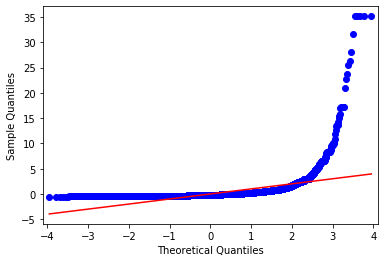

In [24]:
# Standardize the data and plot Q-Q plot to check whether Standardization is suitable to detect outlers
airbnb_stand = (airbnb.price-airbnb.price.mean()) / airbnb.price.std() # standarize
#plot Q-Q visualization
fig = qqplot(data = airbnb_stand,line = 's')

#Standardization is not suitable

{'whiskers': [<matplotlib.lines.Line2D at 0x7fee653dbd50>,
 'caps': [<matplotlib.lines.Line2D at 0x7fee66adb490>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fee653dbd10>],
 'medians': [<matplotlib.lines.Line2D at 0x7fee66adbed0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fee653dbbd0>],
 'means': []}

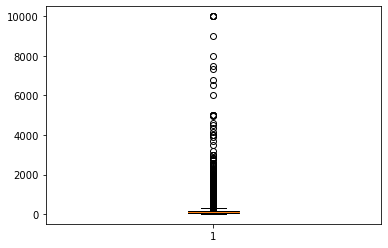

In [25]:
#use boxplot to check price distribution
plt.boxplot(airbnb.price)

<Figure size 1440x1080 with 0 Axes>

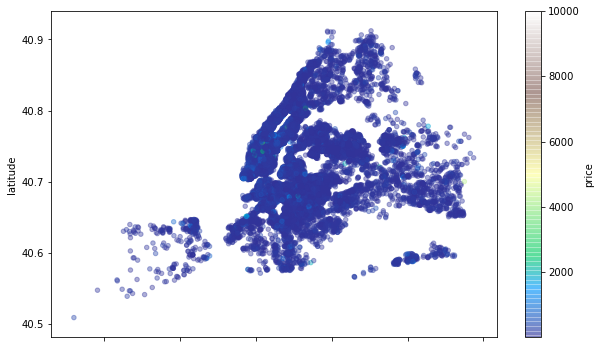

In [29]:
#visualize price distribution without dropping outliers
plt.figure(figsize = (20,15))
airbnb_filter = airbnb[airbnb['price'] <= 500]
airbnb.plot(kind = 'scatter',x = 'longitude',y = 'latitude', c = 'price',
                   cmap = plt.get_cmap('terrain'),alpha = 0.4,figsize = (10,6))

<Figure size 1440x1080 with 0 Axes>

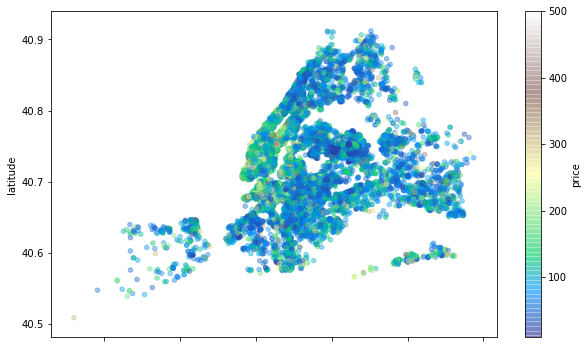

In [26]:
#Drop Price > 500 according to Quartile and visualize it
plt.figure(figsize = (20,15))
airbnb_filter = airbnb[airbnb['price'] <= 500]
airbnb_filter.plot(kind = 'scatter',x = 'longitude',y = 'latitude', c = 'price',
                   cmap = plt.get_cmap('terrain'),alpha = 0.4,figsize = (10,6))

{'whiskers': [<matplotlib.lines.Line2D at 0x7fee5fbcf050>,
 'caps': [<matplotlib.lines.Line2D at 0x7fee67e3e810>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fee66c235d0>],
 'medians': [<matplotlib.lines.Line2D at 0x7fee67e39e90>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fee67e45790>],
 'means': []}

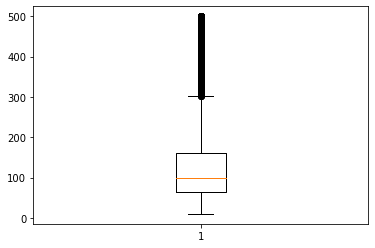

In [27]:
#visualize filtered data
plt.boxplot(airbnb_filter.price)

In [30]:
#Create our own scoring metrics via scaling method
for i in ['availability_365','number_of_crime','number_of_station']:
    airbnb_filter[i] = 10*(airbnb_filter[i] - airbnb_filter[i].min())/(airbnb_filter[i].max()-airbnb_filter[i].min())
    airbnb_filter[i] = airbnb_filter[i].round(1)
#number of crime increase ==> score decrease
airbnb_filter['number_of_crime'] = 10 - airbnb_filter['number_of_crime']
airbnb_filter['rating'] = airbnb_filter['availability_365'] + airbnb_filter['number_of_crime'] + airbnb_filter['number_of_station']
airbnb_filter.sort_values(by='rating',ascending = False,inplace = True)
airbnb_filter.head()


,Unnamed: 0,id,name,latitude,longitude,room_type,price,availability_365,neighbourhood_group,number_of_crime,number_of_station,rating
1360,1360,1143582,Convenient Downtown Room,40.71051,-74.00775,Shared room,75,9.8,Manhattan,7.1,9.3,26.2
25317,25317,45138933,Stylish 1BR Apt | Gym | City Hall Park | NYC,40.71047,-74.00693,Entire home/apt,129,10.0,Manhattan,6.9,8.7,25.6
24579,24579,44393462,Financial District Gem,40.71047,-74.00676,Private room,120,10.0,Manhattan,6.8,8.7,25.5
25316,25316,45138904,Spacious 1BR | Full Kitchen | Gym | City Hall ...,40.71211,-74.00726,Entire home/apt,129,10.0,Manhattan,6.7,8.7,25.4
18088,18088,38236832,The Residences at W New York - Downtown - Apt 27E,40.70996,-74.01276,Entire home/apt,142,9.9,Manhattan,7.3,8.0,25.2


<Figure size 1440x1080 with 0 Axes>

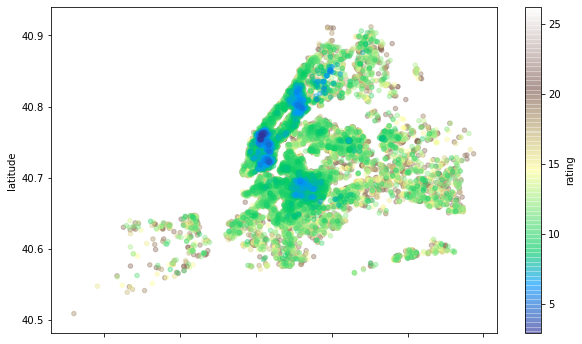

In [31]:
#create rating distribution
plt.figure(figsize = (20,15))
airbnb_filter.plot(kind = 'scatter',x = 'longitude',y = 'latitude', c = 'rating',
                   cmap = plt.get_cmap('terrain'),alpha = 0.4,figsize = (10,6))

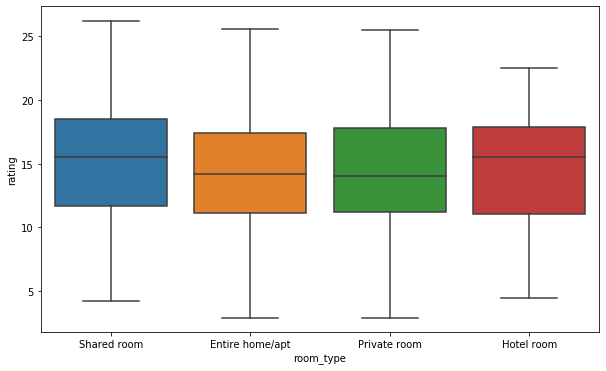

In [32]:
#rating by room_type
plt.figure(figsize = (10,6))
sns.boxplot(data = airbnb_filter, x = 'room_type',y = 'rating')

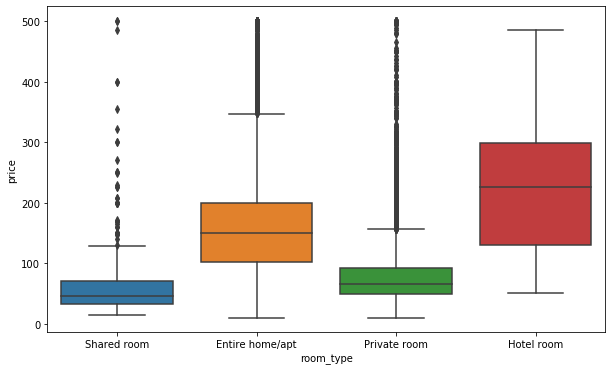

In [33]:
#price by room_type
plt.figure(figsize = (10,6))
sns.boxplot(data = airbnb_filter, x = 'room_type',y = 'price')

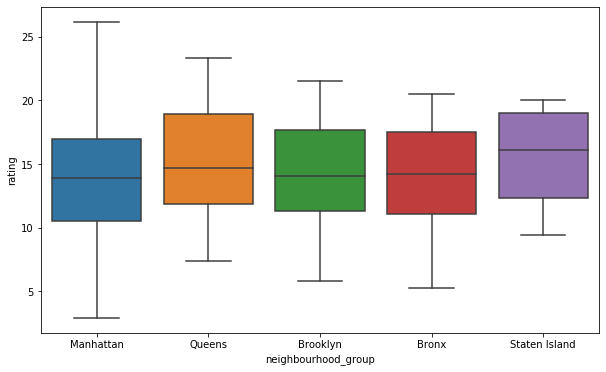

In [34]:
#visualize rating by BORO
plt.figure(figsize = (10,6))
sns.boxplot(data = airbnb_filter, x = 'neighbourhood_group',y = 'rating')

In [35]:
#select top 10 airbnb from each boro
topman = airbnb_filter[airbnb_filter['neighbourhood_group'] == 'Manhattan'].iloc[0:10,:]
topqueens = airbnb_filter[airbnb_filter['neighbourhood_group'] == 'Queens'].iloc[0:10,:]
topbroklyn = airbnb_filter[airbnb_filter['neighbourhood_group'] == 'Brooklyn'].iloc[0:10,:]
topbronx = airbnb_filter[airbnb_filter['neighbourhood_group'] == 'Bronx'].iloc[0:10,:]
topisland = airbnb_filter[airbnb_filter['neighbourhood_group'] == 'Staten Island'].iloc[0:10,:]

# Visualize TOP 10 airbnb from each boro on map

In [36]:
#create worldmap
tiles = 'Stamen Terrain'
NY_map = folium.Map(location = [40.75362, -73.98377],zoom_start = 13,tiles = tiles)

# add all subway station
for lat,lng,stop in zip(station.latitude,station.longitude,station.NAME):
        folium.Marker([lat,lng],popup = stop,icon=folium.Icon(icon='cloud')).add_to(NY_map)
#add top 10 of each area to the map
for i in [topman,topqueens,topbroklyn,topbronx,topisland]:
    for lat,lng,name1,name2,name3 in zip(i.latitude,i.longitude,i.name,i.number_of_crime,i.number_of_station):
            folium.Marker([lat,lng],popup = ['ID:'+str(name1),'Crime(0.5 miles):'+str(name2),'Station(0.2 miles):'+str(name3)],icon = folium.Icon(color = 'red',icon = 'info-sign')).add_to(NY_map)


#add Crime cluster on NY_map
crime_location = list(zip(all_crime.Latitude,all_crime.Longitude))
cluster = plugins.MarkerCluster(locations = crime_location)
NY_map.add_child(cluster)

In [37]:
#export map to html
NY_map.save('top10.html')

# Visualize all hotel rooms on map

In [38]:
#create worldmap
tiles = 'Stamen Terrain'
NY_map = folium.Map(location = [40.75362, -73.98377],zoom_start = 13,tiles = tiles)

#select hotel room only
airbnb_hotel= airbnb_filter[airbnb_filter['room_type'] == 'Hotel room']

#visualize all hotel rooms on map
for lat,lng,name1,name2,name3 in zip(airbnb_hotel.latitude,airbnb_hotel.longitude,airbnb_hotel.name,airbnb_hotel.number_of_crime,airbnb_hotel.number_of_station):
        folium.Marker(
            [lat,lng],popup = ['ID:'+str(name1),'Crime(0.5 miles):'+str(name2),'Station(0.2 miles):'+str(name3)]
        ,icon = folium.Icon(color = 'red',icon = 'info-sign')).add_to(NY_map)



#add Crime cluster on NY_map
crime_location = list(zip(all_crime.Latitude,all_crime.Longitude))
cluster = plugins.MarkerCluster(locations = crime_location)
NY_map.add_child(cluster)

In [41]:
airbnb_filter.head()

,Unnamed: 0,id,name,latitude,longitude,room_type,price,availability_365,neighbourhood_group,number_of_crime,number_of_station,rating
1360,1360,1143582,Convenient Downtown Room,40.71051,-74.00775,Shared room,75,9.8,Manhattan,7.1,9.3,26.2
25317,25317,45138933,Stylish 1BR Apt | Gym | City Hall Park | NYC,40.71047,-74.00693,Entire home/apt,129,10.0,Manhattan,6.9,8.7,25.6
24579,24579,44393462,Financial District Gem,40.71047,-74.00676,Private room,120,10.0,Manhattan,6.8,8.7,25.5
25316,25316,45138904,Spacious 1BR | Full Kitchen | Gym | City Hall ...,40.71211,-74.00726,Entire home/apt,129,10.0,Manhattan,6.7,8.7,25.4
18088,18088,38236832,The Residences at W New York - Downtown - Apt 27E,40.70996,-74.01276,Entire home/apt,142,9.9,Manhattan,7.3,8.0,25.2


# User can use search function to find airbnb

In [42]:
airbnbname = input('Please enter the name of airbnb')
temp = airbnb_filter[airbnb_filter.name ==airbnbname]

tiles = 'Stamen Terrain'
NY_map = folium.Map(location = [temp.latitude,temp.longitude],zoom_start = 20,tiles = tiles)

# add all subway station
for lat,lng,stop in zip(station.latitude,station.longitude,station.NAME):
        folium.Marker([lat,lng],popup = stop,icon=folium.Icon(icon='cloud')).add_to(NY_map)
#add specific airbnb
for lat,lng,name1,name2,name3 in zip(temp.latitude,temp.longitude,temp.name,temp.number_of_crime,temp.number_of_station):
        folium.Marker(
            [lat,lng],popup = ['ID:'+str(name1),'Crime(0.5 miles):'+str(name2),'Station(0.2 miles):'+str(name3)]
        ,icon = folium.Icon(color = 'red',icon = 'info-sign')).add_to(NY_map)
#add red circle on map
for lat,lng in zip(temp.latitude,temp.longitude):
        folium.Circle(
            [lat,lng],radius = 300,color = 'red'
        ).add_to(NY_map)



#add Crime cluster on NY_map
crime_location = list(zip(all_crime.Latitude,all_crime.Longitude))
cluster = plugins.MarkerCluster(locations = crime_location)
NY_map.add_child(cluster)

Please enter the name of airbnbConvenient Downtown Room
